# TC1002S Herramientas computacionales: el arte de la analítica

This is a notebook with all your work for the final evidence of this course


# Niveles de dominio a demostrar con la evidencia

### SING0202A

Interpreta interacciones entre variables relevantes en un problema, como base para la construcción de modelos bivariados basados en datos de un fenómeno investigado que le permita reproducir la respuesta del mismo. Es capaz de construir modelos bivariados que expliquen el comportamiento de un fenómeno.


# Student information

- Name: Ana Karen Zetter Márquez

- ID: A01637124

- My carreer: ITC


# Importing libraries

In [371]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from google.colab import drive
from sklearn.cluster import KMeans
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix

# PART 1

## Do clustering using your assigned dataset

## a) Load data

In [283]:
#Mount drive
drive.mount('/content/drive')
!ls '/content/drive/MyDrive/Profesional/Semestre 5/Análisis de datos/cartwheel.csv'

#Define the file path
file_path = '/content/drive/MyDrive/Profesional/Semestre 5/Análisis de datos/A01637124_X.csv'

#Read the CSV file as a pandas DataFrame
df = pd.read_csv(file_path)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
'/content/drive/MyDrive/Profesional/Semestre 5/Análisis de datos/cartwheel.csv'


## b) Data managment


Print the first 7 rows

In [284]:
df.head(7)

,Unnamed: 0,x1,x2,x3,x4,x5,x6,x7,x8,x9,x10,x11,x12,x13
0,0,-3.688168,5.405881,5.901972,-3.629556,-1.767962,8.748200,-5.006674,-1.255728,3.422085,11.393772,5.710286,-4.052344,-1.383783
1,1,0.174530,2.784267,9.368199,-0.352114,-3.252501,11.213776,-1.815133,-3.438462,0.692271,11.512039,8.164136,-3.503708,3.543413
2,2,3.012787,-5.830198,6.234913,-1.763100,-2.082013,-3.099772,6.516240,-3.459866,-7.978443,-7.030263,0.936578,-0.816318,-14.778948
3,3,3.761852,-6.045025,6.735836,3.577672,-3.702015,0.638926,4.155828,-0.996355,-7.702631,-8.543932,1.461526,3.467505,-10.682595
4,4,5.537542,7.278194,5.601934,-5.876587,-4.624274,2.065316,2.820617,9.209372,5.989065,-1.075092,-8.727744,-3.234842,3.075779
5,5,-5.078426,9.294345,-4.299844,-9.054299,9.520873,8.472939,-8.299936,0.111001,-4.147884,-6.015273,-0.688249,4.774120,2.552431
6,6,3.655986,-13.565931,7.476658,-3.115660,-0.578262,-3.952295,3.775243,-3.993834,-5.352197,-8.072875,3.163390,2.181045,-12.232437


Print the last 4 rows

In [285]:
df.tail(4)

,Unnamed: 0,x1,x2,x3,x4,x5,x6,x7,x8,x9,x10,x11,x12,x13
441,441,12.506629,4.381186,9.714517,-7.726393,-6.885128,-3.580697,1.521500,6.398406,7.407819,-2.712658,-5.437715,-4.619671,-0.999941
442,442,5.690282,-8.729904,-4.520031,5.377853,6.522952,-2.402728,-10.598687,3.688725,3.724871,-9.061342,-10.799969,-8.296547,-8.151932
443,443,7.757728,2.923105,8.862924,-8.769731,-7.258287,-1.796730,3.724173,3.198735,11.002466,-1.605767,-11.017463,-5.989134,5.231285
444,444,-1.164158,3.237662,5.901103,3.752836,0.549916,8.443379,-3.303310,-4.592010,1.068967,8.706162,6.869395,-1.898016,2.132520


How many rows and columns are in your data?

Use the `shape` method

In [286]:
#445 rows and 14 columns
df.shape

(445, 14)

Print the name of all columns

Use the `columns` method

In [287]:
print(df.columns)

Index(['Unnamed: 0', 'x1', 'x2', 'x3', 'x4', 'x5', 'x6', 'x7', 'x8', 'x9',
       'x10', 'x11', 'x12', 'x13'],
      dtype='object')


What is the data type in each column

Use the `dtypes` method

In [288]:
print(df.dtypes)

Unnamed: 0      int64
x1            float64
x2            float64
x3            float64
x4            float64
x5            float64
x6            float64
x7            float64
x8            float64
x9            float64
x10           float64
x11           float64
x12           float64
x13           float64
dtype: object


What is the meaning of rows and columns?

Your responses here:

1. The columns represent the variables. In this case there are 13 different types of data collected (variables) and one ID value.

2. The rows represent the number of observations for each variable.

3. Except for the ID which is an int, all of the values are float values.

...

Print a statistical summary of your columns


In [289]:
print(df.describe())

       Unnamed: 0          x1          x2          x3          x4          x5  \
count  445.000000  445.000000  445.000000  445.000000  445.000000  445.000000   
mean   222.000000    2.905774    1.998962    2.498978   -1.750966    0.187432   
std    128.604691    4.565840    6.888307    5.550875    5.607180    5.914062   
min      0.000000   -8.443369  -13.565931   -9.318712  -15.038206  -12.258265   
25%    111.000000   -0.717689   -4.985627   -2.467998   -7.427627   -4.167778   
50%    222.000000    3.818922    2.880585    2.802895   -0.198933   -1.031847   
75%    333.000000    6.533574    8.361443    7.529905    3.021002    6.098847   
max    444.000000   12.506629   14.581014   13.493147    8.045446   12.864524   

               x6          x7          x8          x9         x10         x11  \
count  445.000000  445.000000  445.000000  445.000000  445.000000  445.000000   
mean     3.850038   -0.363986    1.802023    1.423754   -2.626514   -0.197488   
std      5.278045    6.8846

1. What is the minumum and maximum values of each variable:
- Minimum values are:
-> x1 = -8.443369,  x2 = -13.565931, x3 = -9.318712, x4 = -15.038206, x5 = -12.258265, x6 = -6.138961, x7 = -13.081034, x8 = -8.083287, x9 = -11.058852, x10 = -11.490886, x11 = -13.966942, x12 = -14.288141, x13 = -14.778948

- Maximum values are:
-> x1 = 12.506629, x2 = 14.581014, x3 = 13.493147, x4 = 8.045446, x5 = 12.864524, x6 = 14.781019, x7 = 12.745970, x8 = 9.372930, x9 = 14.201407, x10 = 12.742732, x11 = 13.152158, x12 = 8.979969, x13 = 6.524049

2. What is the mean and standar deviation of each variable:
- The mean is:
-> x1 = 2.905774, x2 = 1.998962, x3 = 2.498978, x4 = -1.750966, x5 = 0.187432, x6 = 3.850038, x7 = -0.363986, x8 = 1.802023, x9 = 1.423754, x10 = -2.626514, x11 = -0.197488, x12 = -2.020401, x13 = -2.019560

- The standart deviation is:
-> x1 = 4.565840, x2 = 6.888307, x3 = 5.550875, x4 = 5.607180, x5 = 5.914062, x6 = 5.278045, x7 = 6.884613, x8 = 3.997988, x9 = 6.122591, x10 = 5.731152, x11 = 6.852109, x12 = 4.952858, x13 = 5.173756

3. What the 25%, 50% and 75% represent?:
- They represent the percentiles of the data.
-> 25% percentile (first quartile) is the value below which 25% of the data will fall, meaning that 25% of the data is less than or equal to the value in the first quartile. The same applies to the others: 50% of the data will fall below the 50% percentile (second quartile), and 75% below the 75% percentile (third quartile). 50% of centered data will be between the 25% and 75% percentile.

Rename the columns using the same name with capital letters

In [290]:
df.rename(columns={"x1": "X1", "x2": "X2", "x3": "X3", "x4": "X4", "x5": "X5", "x6": "X6", "x7": "X7", "x8": "X8", "x9": "X9", "x10": "X10", "x11": "X11", "x12": "X12", "x13": "X13"})

,Unnamed: 0,X1,X2,X3,X4,X5,X6,X7,X8,X9,X10,X11,X12,X13
0,0,-3.688168,5.405881,5.901972,-3.629556,-1.767962,8.748200,-5.006674,-1.255728,3.422085,11.393772,5.710286,-4.052344,-1.383783
1,1,0.174530,2.784267,9.368199,-0.352114,-3.252501,11.213776,-1.815133,-3.438462,0.692271,11.512039,8.164136,-3.503708,3.543413
2,2,3.012787,-5.830198,6.234913,-1.763100,-2.082013,-3.099772,6.516240,-3.459866,-7.978443,-7.030263,0.936578,-0.816318,-14.778948
3,3,3.761852,-6.045025,6.735836,3.577672,-3.702015,0.638926,4.155828,-0.996355,-7.702631,-8.543932,1.461526,3.467505,-10.682595
4,4,5.537542,7.278194,5.601934,-5.876587,-4.624274,2.065316,2.820617,9.209372,5.989065,-1.075092,-8.727744,-3.234842,3.075779
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
440,440,6.672227,-6.962321,8.120502,2.252663,-4.216319,0.421555,9.206805,-2.892954,-6.047165,-4.893728,-1.428163,3.514391,-11.858116
441,441,12.506629,4.381186,9.714517,-7.726393,-6.885128,-3.580697,1.521500,6.398406,7.407819,-2.712658,-5.437715,-4.619671,-0.999941
442,442,5.690282,-8.729904,-4.520031,5.377853,6.522952,-2.402728,-10.598687,3.688725,3.724871,-9.061342,-10.799969,-8.296547,-8.151932
443,443,7.757728,2.923105,8.862924,-8.769731,-7.258287,-1.796730,3.724173,3.198735,11.002466,-1.605767,-11.017463,-5.989134,5.231285


Rename the columns to their original names

In [291]:
df.rename(columns={"X1": "x1", "X2": "x2", "X3": "x3", "X4": "x4", "X5": "x5", "X6": "x6", "X7": "x7", "X8": "x8", "X9": "x9", "X10": "x10", "X11": "x11", "X12": "x12", "X13": "x13"})

,Unnamed: 0,x1,x2,x3,x4,x5,x6,x7,x8,x9,x10,x11,x12,x13
0,0,-3.688168,5.405881,5.901972,-3.629556,-1.767962,8.748200,-5.006674,-1.255728,3.422085,11.393772,5.710286,-4.052344,-1.383783
1,1,0.174530,2.784267,9.368199,-0.352114,-3.252501,11.213776,-1.815133,-3.438462,0.692271,11.512039,8.164136,-3.503708,3.543413
2,2,3.012787,-5.830198,6.234913,-1.763100,-2.082013,-3.099772,6.516240,-3.459866,-7.978443,-7.030263,0.936578,-0.816318,-14.778948
3,3,3.761852,-6.045025,6.735836,3.577672,-3.702015,0.638926,4.155828,-0.996355,-7.702631,-8.543932,1.461526,3.467505,-10.682595
4,4,5.537542,7.278194,5.601934,-5.876587,-4.624274,2.065316,2.820617,9.209372,5.989065,-1.075092,-8.727744,-3.234842,3.075779
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
440,440,6.672227,-6.962321,8.120502,2.252663,-4.216319,0.421555,9.206805,-2.892954,-6.047165,-4.893728,-1.428163,3.514391,-11.858116
441,441,12.506629,4.381186,9.714517,-7.726393,-6.885128,-3.580697,1.521500,6.398406,7.407819,-2.712658,-5.437715,-4.619671,-0.999941
442,442,5.690282,-8.729904,-4.520031,5.377853,6.522952,-2.402728,-10.598687,3.688725,3.724871,-9.061342,-10.799969,-8.296547,-8.151932
443,443,7.757728,2.923105,8.862924,-8.769731,-7.258287,-1.796730,3.724173,3.198735,11.002466,-1.605767,-11.017463,-5.989134,5.231285


Use two different alternatives to get one of the columns

In [292]:
df.x4

,x4
0,-3.629556
1,-0.352114
2,-1.763100
3,3.577672
4,-5.876587
...,...
440,2.252663
441,-7.726393
442,5.377853
443,-8.769731


In [293]:
df["x4"]

,x4
0,-3.629556
1,-0.352114
2,-1.763100
3,3.577672
4,-5.876587
...,...
440,2.252663
441,-7.726393
442,5.377853
443,-8.769731


Get a slice of your data set: second and thrid columns and rows from 62 to 72

In [294]:
#Assuming second column is the one with index 1, given indexes are 0,1,2,3...
df.iloc[62:72, 1:3]

,x1,x2
62,7.356536,5.477925
63,7.115535,1.932213
64,9.704123,3.633721
65,0.570560,0.902705
66,5.838804,7.010899
67,2.262850,9.260839
68,8.300581,-5.647574
69,-4.747999,11.902283
70,0.348433,0.192289
71,7.697432,-5.172400


For the second and thrid columns, calculate the number of null and not null values and verify that their sum equals the total number of rows

In [295]:
#Second column
print(df.iloc[:, 2].isnull().sum())
print(df.iloc[:, 2].notnull().sum())
print(df.iloc[:, 2].isnull().sum() + df.iloc[:, 2].notnull().sum())
#Rows = 445 / #Not null values 445

0
445
445


In [296]:
#Third column
print(df.iloc[:, 3].isnull().sum())
print(df.iloc[:, 3].notnull().sum())
print(df.iloc[:, 3].isnull().sum() + df.iloc[:, 2].notnull().sum())

0
445
445


Discard the last column


In [297]:
df.drop(df.columns[[13]], axis = 1, inplace = True)
df

,Unnamed: 0,x1,x2,x3,x4,x5,x6,x7,x8,x9,x10,x11,x12
0,0,-3.688168,5.405881,5.901972,-3.629556,-1.767962,8.748200,-5.006674,-1.255728,3.422085,11.393772,5.710286,-4.052344
1,1,0.174530,2.784267,9.368199,-0.352114,-3.252501,11.213776,-1.815133,-3.438462,0.692271,11.512039,8.164136,-3.503708
2,2,3.012787,-5.830198,6.234913,-1.763100,-2.082013,-3.099772,6.516240,-3.459866,-7.978443,-7.030263,0.936578,-0.816318
3,3,3.761852,-6.045025,6.735836,3.577672,-3.702015,0.638926,4.155828,-0.996355,-7.702631,-8.543932,1.461526,3.467505
4,4,5.537542,7.278194,5.601934,-5.876587,-4.624274,2.065316,2.820617,9.209372,5.989065,-1.075092,-8.727744,-3.234842
...,...,...,...,...,...,...,...,...,...,...,...,...,...
440,440,6.672227,-6.962321,8.120502,2.252663,-4.216319,0.421555,9.206805,-2.892954,-6.047165,-4.893728,-1.428163,3.514391
441,441,12.506629,4.381186,9.714517,-7.726393,-6.885128,-3.580697,1.521500,6.398406,7.407819,-2.712658,-5.437715,-4.619671
442,442,5.690282,-8.729904,-4.520031,5.377853,6.522952,-2.402728,-10.598687,3.688725,3.724871,-9.061342,-10.799969,-8.296547
443,443,7.757728,2.923105,8.862924,-8.769731,-7.258287,-1.796730,3.724173,3.198735,11.002466,-1.605767,-11.017463,-5.989134


### Questions

Based on the previos results, provide a full description of yout dataset

Your response:

The original dataset consists of 5785 data points in total, excluding the ID column. The data seems to be a collection of 445 observations (rows) of 13 different variables (columns). The mean of each variable is between - 3 and 3, with a standart deviation of no more than 7.

It seems to be that the values in the same row are increasing and decreasing, making an irregular wave-like pattern, so it is possible that the x value represents time. However, there is not enough information to confirm this.

The processed data contains no null values and the final column has been removed. The final dataset contains 5340 data points: 445 observations and 12 variables.


## c) Data visualization

Plot in the histogram of one of the variables

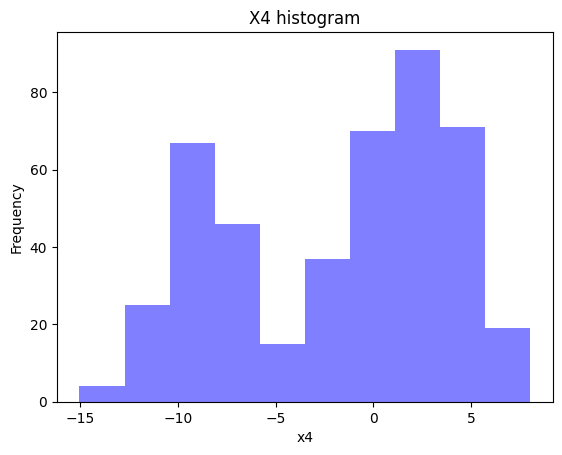

In [411]:
# Plot histogram
plt.title('X4 histogram')
plt.hist(df['x4'], alpha = 0.5, color='blue')
plt.xlabel('x4')
plt.ylabel('Frequency')
plt.show()

Plot in the same figure the histogram of two variables



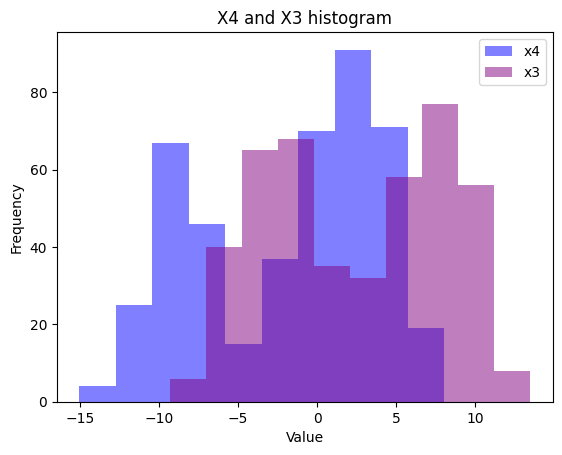

In [299]:
# Plot histogram
plt.title('X4 and X3 histogram')
plt.hist(df['x4'], alpha=0.5, label='x4', color='blue')
plt.hist(df['x3'], alpha=0.5, label='x3', color='purple')
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.legend()
plt.show()

Based on these plots, provide a description of your data:

- Your response here:
-> The values of X4 are greater than -16 and smaller than 10.
The values of X3 are greater than -10 and smaller than 16.
X3 and X4 follow unsynchronized wave-like patterns, forming 2 bumps. The patterns are very similar to each other, with the global maximum value being in the second bump.
->Looking at othe histograms, we can see that in general the data follows a normal distribution (one peak) or a bimodal distribution (two peaks).

Plot the boxplot of one of the variables

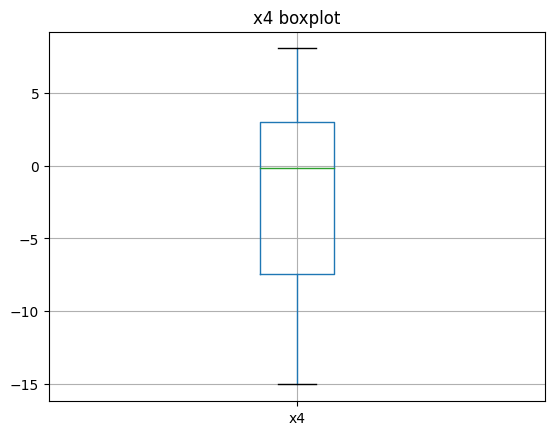

In [300]:
#Plot boxplot
plt.title('x4 boxplot')
df.boxplot(column = 'x4')
plt.show()

Plot in the same figure the boxplot of two variables

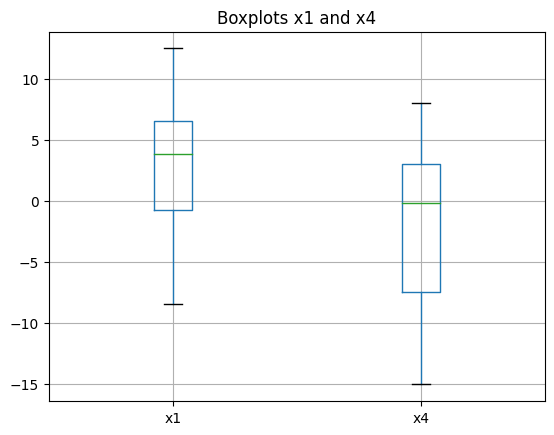

In [301]:
#Plot boxplots
df.boxplot(column = ['x1','x4'])
plt.title('Boxplots x1 and x4')
plt.show()

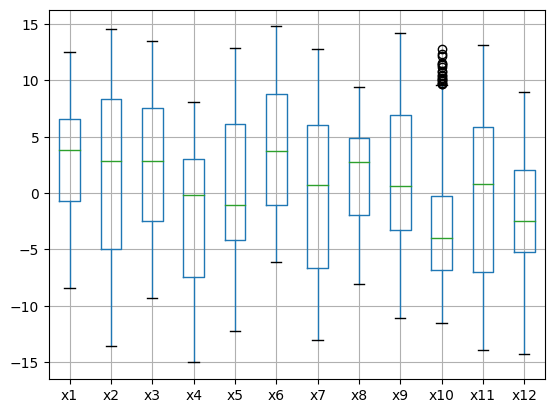

In [302]:
#Extra: Various boxplots
df.boxplot(column = ['x1','x2','x3','x4','x5','x6','x7','x8','x9','x10','x11','x12'])
plt.show()

Based on these plots, provide a description of your data:

- Your response here:
-> Only x10 has outlier values. However, these extreme values are not significantly different from the rest of the dataset.
-> For the majority of the cases (8/12), the median or second quartile (50%) lies closer to the third quartile (75%) than to the first quartile (25%).
-> Looking at the final plot with all the boxplots, it can be seen that the wave-like pattern remains.


Plot the scatter plot between all pair of variables

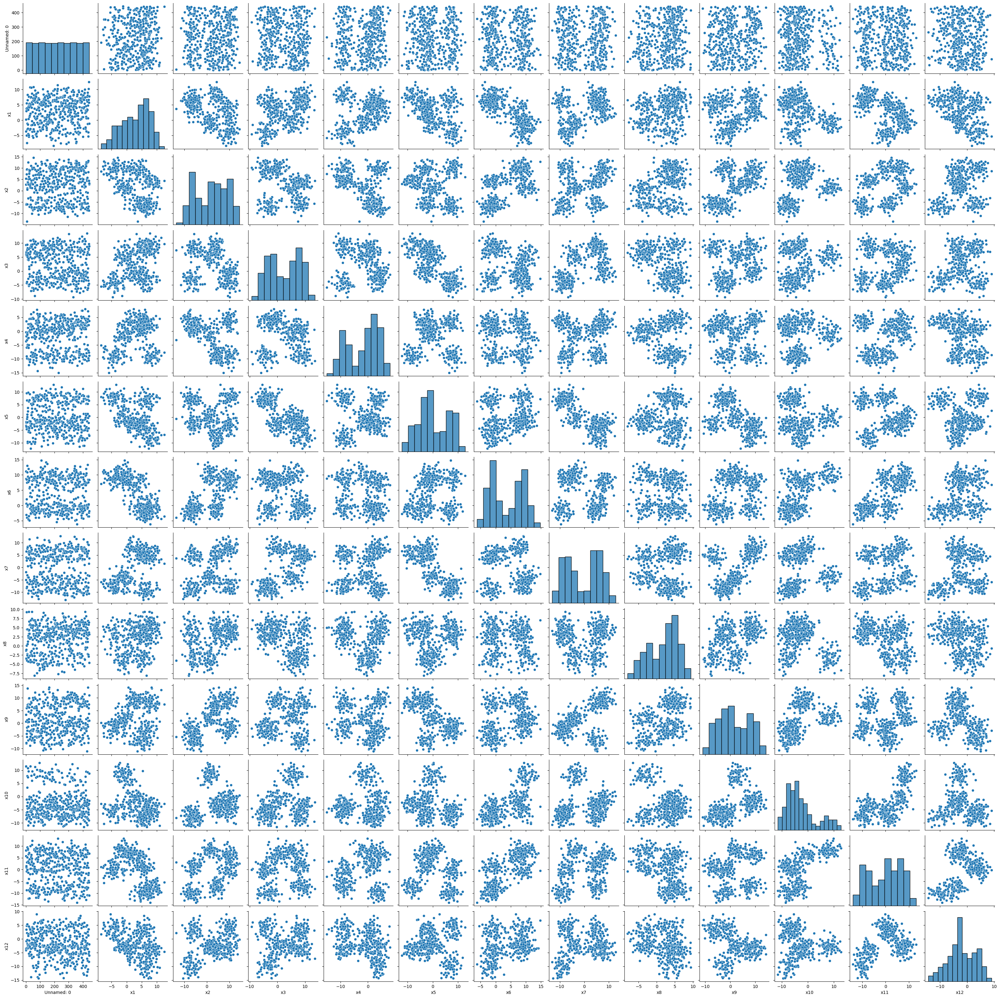

In [303]:
sns.pairplot(df)

### Questions

Based on the previous plots, provide a full description of yout dataset

- Your response:
-> Clusters cleary form when comparing the different variables between themselves. (Note: ID column does not form clear clusters but it is not counted as a variable.)
-> The amount of clusters varies from around 3 to 6 clusters.




## d) Kmeans

Do Kmeans clustering assuming a number of clusters accorging to your scatter plots

In [304]:
cluster_num = 3

Add to your dataset a column with the estimated cluster to each data point

In [305]:
kmeans = KMeans(n_clusters=cluster_num, random_state=42, n_init=10)
estimated = kmeans.fit_predict(df[['x1', 'x2', 'x3', 'x4','x5','x6','x7','x8','x9','x10','x11','x12']])
df["cluster"] = estimated
df

,Unnamed: 0,x1,x2,x3,x4,x5,x6,x7,x8,x9,x10,x11,x12,cluster
0,0,-3.688168,5.405881,5.901972,-3.629556,-1.767962,8.748200,-5.006674,-1.255728,3.422085,11.393772,5.710286,-4.052344,2
1,1,0.174530,2.784267,9.368199,-0.352114,-3.252501,11.213776,-1.815133,-3.438462,0.692271,11.512039,8.164136,-3.503708,2
2,2,3.012787,-5.830198,6.234913,-1.763100,-2.082013,-3.099772,6.516240,-3.459866,-7.978443,-7.030263,0.936578,-0.816318,0
3,3,3.761852,-6.045025,6.735836,3.577672,-3.702015,0.638926,4.155828,-0.996355,-7.702631,-8.543932,1.461526,3.467505,0
4,4,5.537542,7.278194,5.601934,-5.876587,-4.624274,2.065316,2.820617,9.209372,5.989065,-1.075092,-8.727744,-3.234842,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
440,440,6.672227,-6.962321,8.120502,2.252663,-4.216319,0.421555,9.206805,-2.892954,-6.047165,-4.893728,-1.428163,3.514391,0
441,441,12.506629,4.381186,9.714517,-7.726393,-6.885128,-3.580697,1.521500,6.398406,7.407819,-2.712658,-5.437715,-4.619671,0
442,442,5.690282,-8.729904,-4.520031,5.377853,6.522952,-2.402728,-10.598687,3.688725,3.724871,-9.061342,-10.799969,-8.296547,1
443,443,7.757728,2.923105,8.862924,-8.769731,-7.258287,-1.796730,3.724173,3.198735,11.002466,-1.605767,-11.017463,-5.989134,0


Print the number associated to each cluster

In [306]:
#222 elements in cluster 2, 149 in cluster 0 and 74 in cluster 1
print(df['cluster'].value_counts())

cluster
2    222
0    149
1     74
Name: count, dtype: int64


Print the centroids

In [307]:
# Cluster centroids
centroids = kmeans.cluster_centers_
print(centroids)

[[ 6.50500244 -0.86849173  8.38203604 -3.86238521 -5.21230005 -0.62388502
   4.92024326  0.85346312  0.68235347 -5.37647545 -3.01818263 -0.31281379]
 [ 6.16735827 -6.67980217 -3.15575968  3.54061652  6.94999325 -1.70749759
  -8.98873288  4.12573165 -2.34419138 -7.33417332 -9.69537282 -9.4700708 ]
 [-0.59711919  6.81643539  0.43535114 -2.09770275  1.55738932  8.70531765
  -1.03569254  1.66409993  3.17734329  0.78840088  4.86164223 -0.68326004]]


Print the intertia metric

In [308]:
#Inertia
sse = kmeans.inertia_
print(sse)

93742.95703268879


Plot a scatter plot of your data using different color for each cluster. Also plot the centroids

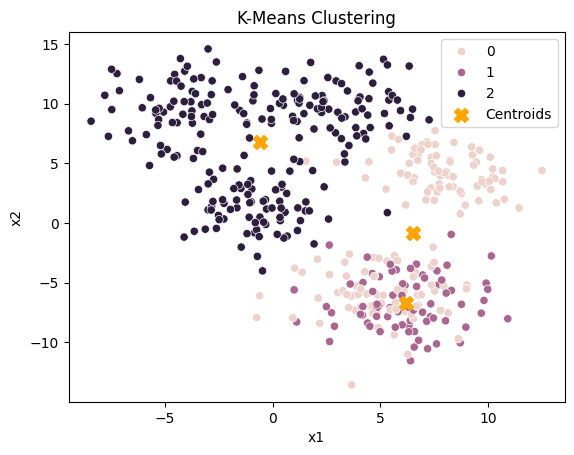

In [309]:
#Scatterplot
sns.scatterplot(x='x1', y='x2', data=df, hue='cluster')
plt.scatter(centroids[:, 0], centroids[:, 1], s=100, c='orange', marker='X', label='Centroids')
plt.title('K-Means Clustering')
plt.legend()
plt.show()

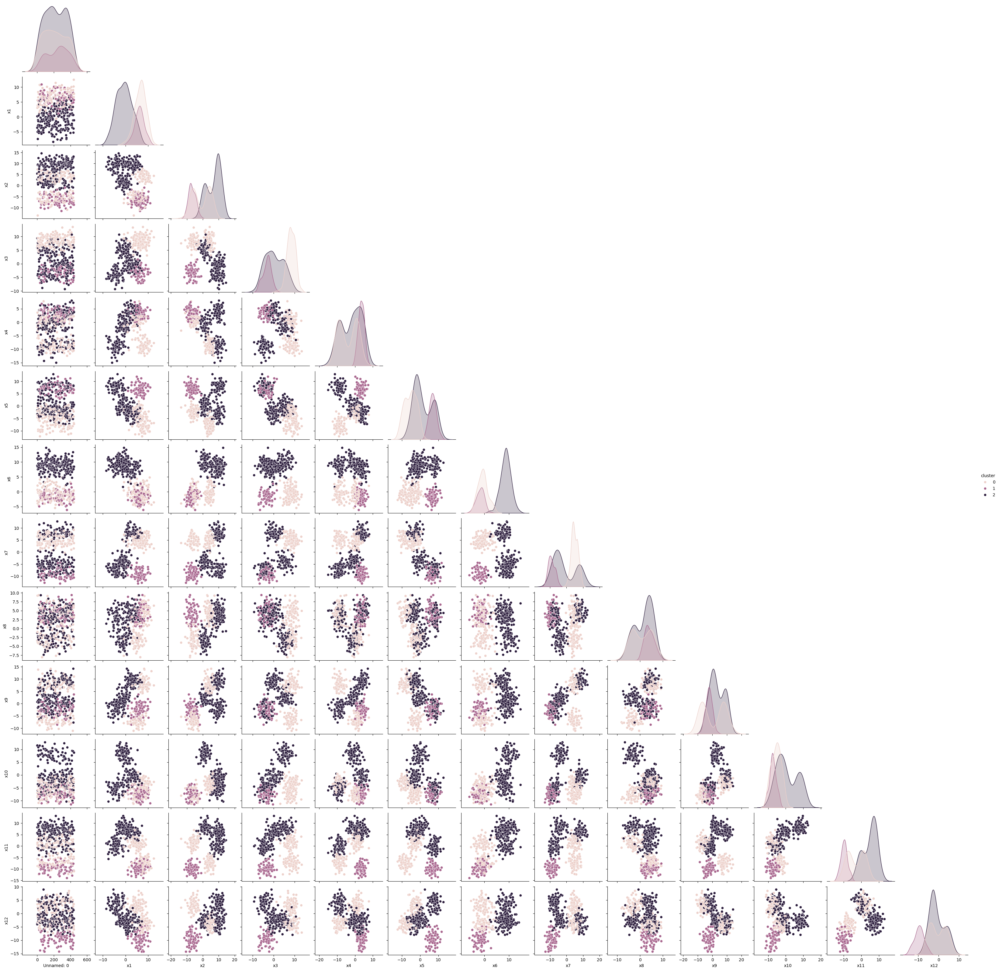

In [310]:
#Extra: Pairplot to visualize all clusters
sns.pairplot(df, hue='cluster', corner = True)

### Questions

Provides a detailed description of your results

Your response:

The clusters appear to be unbalanced with the majority of data points being grouped in one cluster, and few datapoints in another one. Some clusters overlap with each other making it hard to distinguish them. This means that there probably is a better k for the clusters.

## d) Elbow plot

Compute the Elbow plot

In [311]:
# Intialize a list to hold sum of squared error (sse)
sse = []

# Define values of k
k_values = range(1, 11)

# For each k
for k in k_values:
    km = KMeans(n_clusters=k, random_state=42, n_init=10)
    km.fit(df[['x1', 'x2', 'x3', 'x4','x5','x6','x7','x8','x9','x10','x11','x12']])
    sse.append(km.inertia_)

<Axes: >

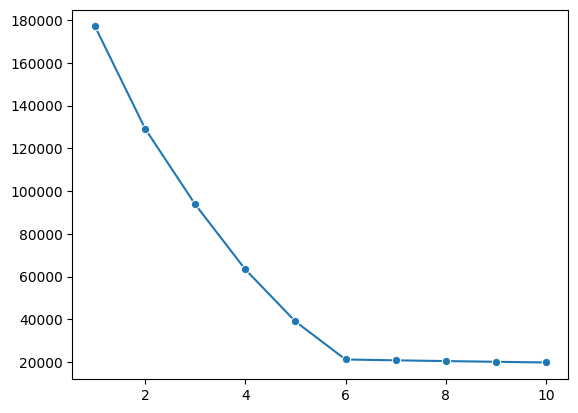

In [312]:
# Plot sse versus k
sns.lineplot(x=k_values, y=sse, marker='o')

### Questions

What is the best number of clusters K? (argue your response)

- Your response:
-> 6 is the number after which change starts to be insignificant, so K=6 would be the best number of clusters. Number before it show significant change between each other so to increase the number is always better, and the numbers after it do not show significant change so to increase the number would not lead to significantly better results.

Does this number of clusters agree with your inital guess? (argue your response, no problem at all if they do not agree)

- Your response:
-> Previously I hypothesized that the number would be between 3 and 6. Since the number is 6, that hypothesis was correct. However, the clustering was done with a k=3, so in that sense it does not agree with my initial guess.
For better results, the Kmeans will be repeated with a k=6.



## e) Additional Section: Kmeans, k=6

Do Kmeans clustering assuming a number of clusters accorging to your scatter plots

In [313]:
cluster_num = 6

Add to your dataset a column with the estimated cluster to each data point

In [314]:
kmeans = KMeans(n_clusters=cluster_num, random_state=42, n_init=10)
estimated = kmeans.fit_predict(df[['x1', 'x2', 'x3', 'x4','x5','x6','x7','x8','x9','x10','x11','x12']])
df["cluster"] = estimated
df

,Unnamed: 0,x1,x2,x3,x4,x5,x6,x7,x8,x9,x10,x11,x12,cluster
0,0,-3.688168,5.405881,5.901972,-3.629556,-1.767962,8.748200,-5.006674,-1.255728,3.422085,11.393772,5.710286,-4.052344,5
1,1,0.174530,2.784267,9.368199,-0.352114,-3.252501,11.213776,-1.815133,-3.438462,0.692271,11.512039,8.164136,-3.503708,5
2,2,3.012787,-5.830198,6.234913,-1.763100,-2.082013,-3.099772,6.516240,-3.459866,-7.978443,-7.030263,0.936578,-0.816318,2
3,3,3.761852,-6.045025,6.735836,3.577672,-3.702015,0.638926,4.155828,-0.996355,-7.702631,-8.543932,1.461526,3.467505,2
4,4,5.537542,7.278194,5.601934,-5.876587,-4.624274,2.065316,2.820617,9.209372,5.989065,-1.075092,-8.727744,-3.234842,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
440,440,6.672227,-6.962321,8.120502,2.252663,-4.216319,0.421555,9.206805,-2.892954,-6.047165,-4.893728,-1.428163,3.514391,2
441,441,12.506629,4.381186,9.714517,-7.726393,-6.885128,-3.580697,1.521500,6.398406,7.407819,-2.712658,-5.437715,-4.619671,4
442,442,5.690282,-8.729904,-4.520031,5.377853,6.522952,-2.402728,-10.598687,3.688725,3.724871,-9.061342,-10.799969,-8.296547,1
443,443,7.757728,2.923105,8.862924,-8.769731,-7.258287,-1.796730,3.724173,3.198735,11.002466,-1.605767,-11.017463,-5.989134,4


Print the number associated to each cluster

In [315]:
#222 elements in cluster 2, 149 in cluster 0 and 74 in cluster 1
print(df['cluster'].value_counts())

cluster
4    75
5    74
2    74
3    74
0    74
1    74
Name: count, dtype: int64


Print the centroids

In [316]:
# Cluster centroids
centroids = kmeans.cluster_centers_
print(centroids)

[[ 2.96025741e+00  9.60421596e+00  1.37344886e-02  3.76066077e+00
  -2.89949257e+00  7.43909293e+00  8.02647649e+00  4.75184887e+00
   9.17634279e+00 -6.21822900e-01  6.38223982e+00 -3.20059120e+00]
 [ 6.16735827e+00 -6.67980217e+00 -3.15575968e+00  3.54061652e+00
   6.94999325e+00 -1.70749759e+00 -8.98873288e+00  4.12573165e+00
  -2.34419138e+00 -7.33417332e+00 -9.69537282e+00 -9.47007080e+00]
 [ 5.04161917e+00 -6.02565628e+00  8.10813974e+00  9.15079595e-01
  -2.56525940e+00 -6.22401324e-01  4.58296384e+00 -2.98909435e+00
  -6.76733507e+00 -7.42434744e+00  1.38972200e+00  3.28653040e+00]
 [-3.99284076e+00  9.57941382e+00 -4.16696555e+00 -9.03141984e+00
   7.80475232e+00  8.81293376e+00 -7.16804418e+00  3.29854446e+00
  -2.03666076e+00 -5.17626578e+00  4.87394592e-03  3.78792823e+00]
 [ 7.94887393e+00  4.21991063e+00  8.65228040e+00 -8.57615048e+00
  -7.82404682e+00 -6.25348928e-01  5.25302561e+00  4.64478648e+00
   8.03271283e+00 -3.35590842e+00 -7.36731520e+00 -3.86416674e+00]
 [-7.

Print the intertia metric

In [317]:
#Inertia
sse = kmeans.inertia_
print(sse)

21195.808457409476


Plot a scatter plot of your data using different color for each cluster. Also plot the centroids

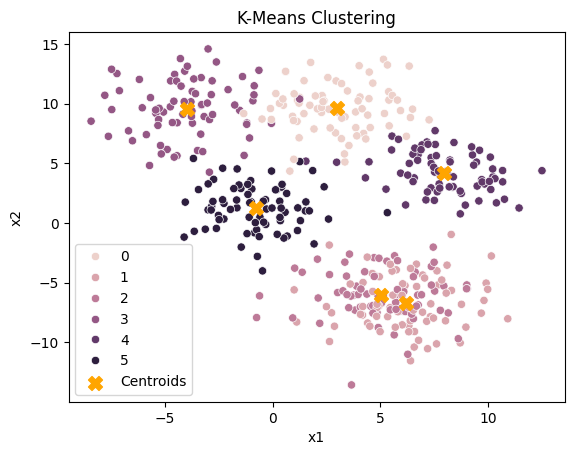

In [318]:
#Scatterplot
sns.scatterplot(x='x1', y='x2', data=df, hue='cluster')
plt.scatter(centroids[:, 0], centroids[:, 1], s=100, c='orange', marker='X', label='Centroids')
plt.title('K-Means Clustering')
plt.legend()
plt.show()

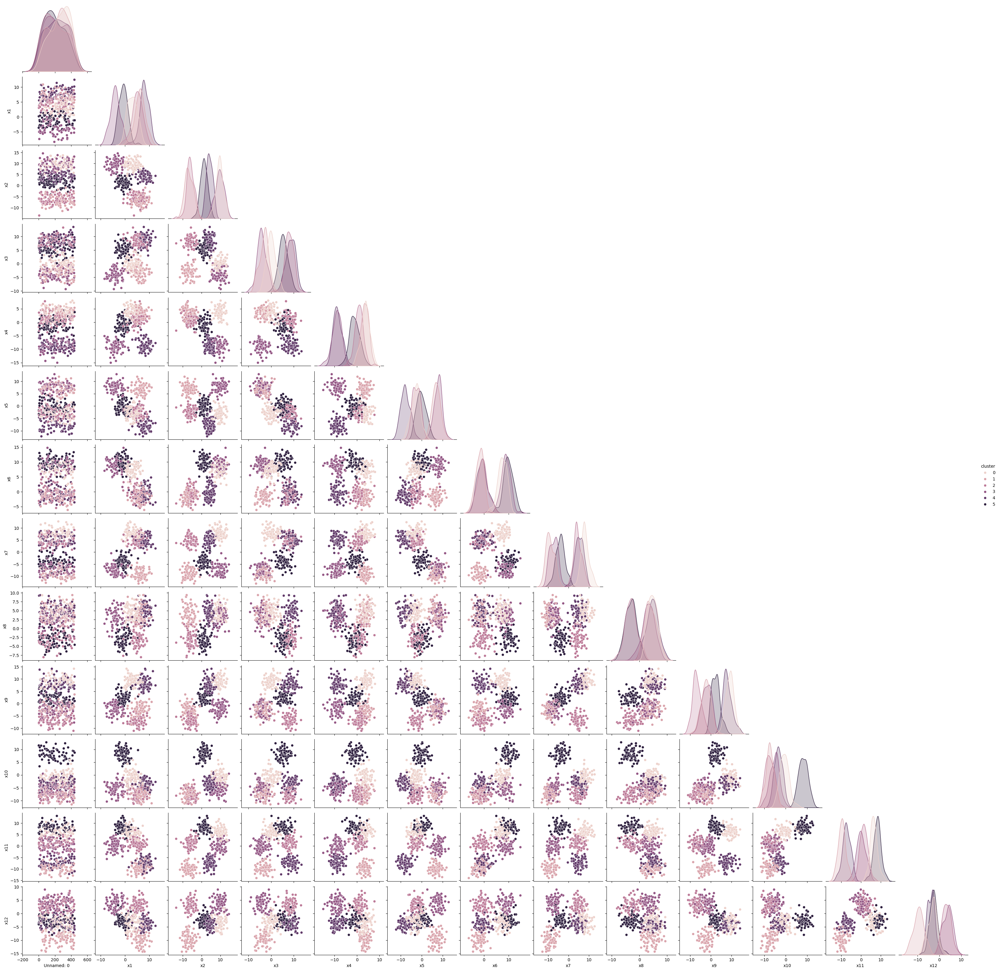

In [319]:
#Extra: Pairplot to visualize all clusters
sns.pairplot(df, hue='cluster', corner = True)

With six clusters, the overlapping still exists but the amount of data points per cluster is more balanced, confirming that K=6 is a better option than k=3.

# PART 2

## Do clustering using the "digits" dataset

1) Load the dataset from "sklearn.datasets"


In [320]:
# Import the dataset
from sklearn.datasets import load_digits

# Load the dataset
DS = load_digits()
DS.keys()

dict_keys(['data', 'target', 'frame', 'feature_names', 'target_names', 'images', 'DESCR'])

2) Plot some of the observations (add in the title the label/digit of that obserbation)

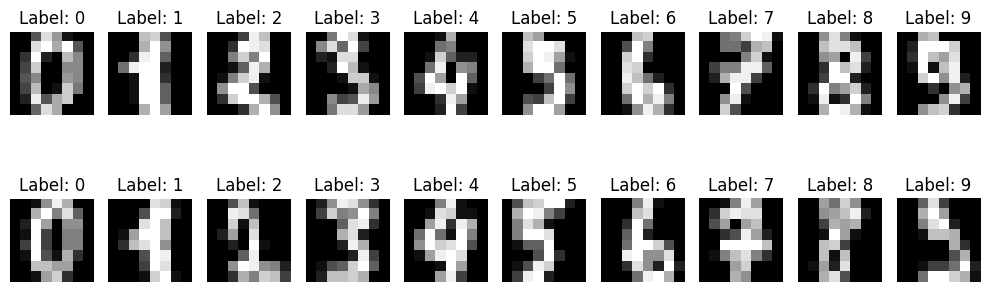

In [321]:
#Number of observations
observations = 20

#Plot iteratively
plt.figure(figsize=(10, 4))
for i in range(observations):
    plt.subplot(2, 10, i + 1)
    plt.imshow(DS.images[i], cmap='gray')
    plt.title(f'Label: {DS.target[i]}')
    plt.axis('off')
plt.tight_layout()
plt.show()

3) Do K means clustering in the following cases:

* KmeansAll: Using all 64 variables/pixels/features

* Kmeans1row: Using only the 8 variables/pixels/features from the firt row

* Kmeans4row: Using only the 8 variables/pixels/features from the fourth row

* Kmeans8row: Using only the 8 variables/pixels/
features from the eighth row


In [322]:
#Row 1 = :8, Row2 = 8:16, Row3 = 16:24, Row4 = 24:32, Row5 = 32:40, Row6 = 40:48, Row7 = 48:56, Row8 = 56:

In [323]:
###KmeansAll: Using all 64 variables/pixels/features
kmeans64 = KMeans(n_clusters=10, random_state=42, n_init=10)
DS['KmeansAll'] = kmeans64.fit_predict(DS.data)
centroides64 = kmeans64.cluster_centers_

###Kmeans1row: Using only the 8 variables/pixels/features from the firt row
kmeans1 = KMeans(n_clusters=10, random_state=42, n_init=10)
DS['Kmeans1row'] = kmeans1.fit_predict(DS.data[:, :8])
centroides1 = kmeans1.cluster_centers_

###Kmeans4row: Using only the 8 variables/pixels/features from the fourth row
kmeans4 = KMeans(n_clusters=10, random_state=42, n_init=10)
DS['Kmeans4row'] = kmeans4.fit_predict(DS.data[:, 24:32])
centroides4 = kmeans4.cluster_centers_

###Kmeans8row: Using only the 8 variables/pixels/ features from the eighth row
kmeans8 = KMeans(n_clusters=10, random_state=42, n_init=10)
DS['Kmeans8row'] = kmeans8.fit_predict(DS.data[:, 56:])
centroides8 = kmeans8.cluster_centers_

4) Verify your results. Plot several observations from the same digit and add in the title the real label and the estimated label to check in what observations the clusterization was correct or incorrect

<Figure size 200x200 with 0 Axes>

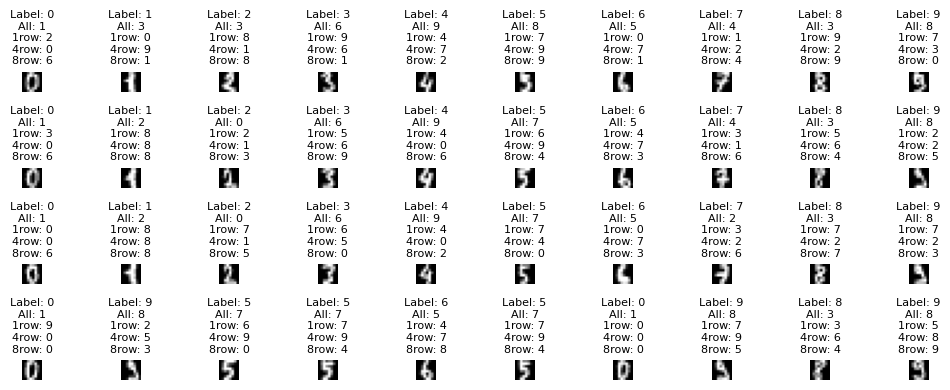

In [324]:
#Number of observations
observations = 40
plt.figure(figsize=(2, 2))
#Plot iteratively
plt.figure(figsize=(10, 4))
for i in range(observations):
    plt.subplot(4, 10, i + 1)
    plt.imshow(DS.images[i], cmap='gray')
    plt.title(f'Label: {DS.target[i]}\n'
                  f'All: {DS.KmeansAll[i]}\n'
                  f'1row: {DS.Kmeans1row[i]}\n'
                  f'4row: {DS.Kmeans4row[i]}\n'
                  f'8row: {DS.Kmeans8row[i]}', fontsize=8)
    plt.axis('off')
plt.tight_layout()
plt.show()

In [325]:
# All: 0=1, 1=2, 2=0, 3=6, 4=9, 5=7, 6=5, 7=4, 8=3, 9=8     # 100% Accuracy: 0, 3, 4, 6, 8, 9 -> 6/10 -> 60% of data
# 1: 100% Accuracy: 4 -> 10%
# 4: 100% Accuracy: 0, 2, 6, -> 30%
# 8: 100% Accuracy: 0 -> 0%

5) Compute the Elbow plot

In [326]:
# Intialize a list to hold sum of squared error (sse)
sse = []

# Define values of k
k_values = range(1, 11)

# For each k
for k in k_values:
    km = KMeans(n_clusters=k, random_state=42, n_init=10)
    km.fit(DS.data)
    sse.append(km.inertia_)

<Axes: >

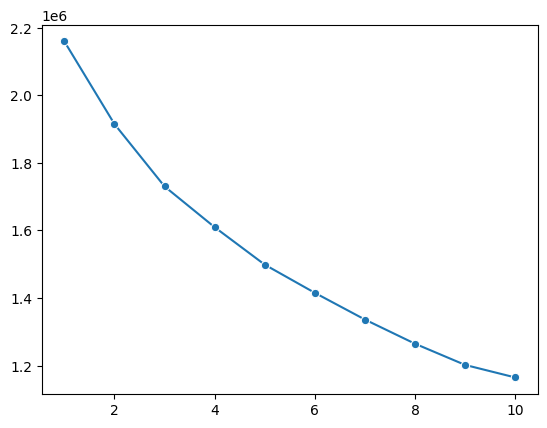

In [327]:
# Plot sse versus k
sns.lineplot(x=k_values, y=sse, marker='o')

### Questions

Provides a detailed description of your results (e.g., in which case the clusterization is better, with KmeansAll, Kmeans1row, Kmeans4row, or Kmeans8row).

- Your response (argue your response):
-> Looking at the elbowplot, there is no point where the change becomes insignificant, meaning that the last point (k=10) will be the best for number of clusters.
-> For clusterization, KmeansAll is the best algorithm. In the data printed above60% of the values with KmeansAll have 100% accuracy, meaning that this is the most accurate. Since the other models take into account less features, they are not as accurate. (10%, 30%, 0%).


# PART 3
## Do classification using the "digits" dataset

1) Load the dataset from "sklearn.datasets"

In [338]:
# Load the dataset
DS = load_digits()
DS.keys()

dict_keys(['data', 'target', 'frame', 'feature_names', 'target_names', 'images', 'DESCR'])

2) Plot some of the observations  (add in the title the label/digit of that obserbation)

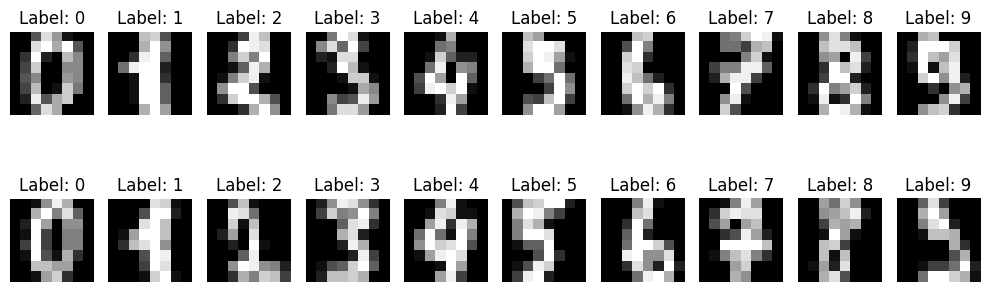

In [329]:
#Number of observations
observations = 20

#Plot iteratively
plt.figure(figsize=(10, 4))
for i in range(observations):
    plt.subplot(2, 10, i + 1)
    plt.imshow(DS.images[i], cmap='gray')
    plt.title(f'Label: {DS.target[i]}')
    plt.axis('off')
plt.tight_layout()
plt.show()

3) Split the dataset in train and test

In [395]:
#Save indices
indices = np.arange(len(DS.data))

#Split data
x_train, x_test, y_train, y_test, idx_train, idx_test = train_test_split(DS.data, DS.target, indices, test_size=0.2, random_state=42)

4) Tune a classifier (Use the train set) in the following cases:

* ClassifierAll: Using all 64 variables/pixels/features

* Classifier1col: Using only the 8 variables/pixels/features from the firt column

* Classifier4col: Using only the 8 variables/pixels/features from the fourth column

* Classifier8col: Using only the 8 variables/pixels/
features from the eighth column

Note: in these four cases always use the same classification algorithm, e.g., a Suport Vector Machine


5) Make predictions (use the test set)

In [396]:
svc = SVC()

###ClassifierAll: Using all 64 variables/pixels/features
class_all = svc.fit(x_train, y_train)
y_predict_all=class_all.predict(x_test)

###Kmeans1row: Using only the 8 variables/pixels/features from the firt row
class1 = svc.fit(x_train[:, :8], y_train)
y_predict1 = class1.predict(x_test[:, :8])

###Kmeans4row: Using only the 8 variables/pixels/features from the fourth row
class4 = svc.fit(x_train[:, 24:32], y_train)
y_predict4 = class4.predict(x_test[:, 24:32])

###Kmeans8row: Using only the 8 variables/pixels/ features from the eighth row
class8 = svc.fit(x_train[:, 56:], y_train)
y_predict8 = class8.predict(x_test[:, 56:])


6) Compute performance metrics

In [397]:
###ClassifierAll: Using all 64 variables/pixels/features
print(accuracy_score(y_test, y_predict_all))
confusion=confusion_matrix(y_test,y_predict_all)
print(confusion)

###Kmeans1row: Using only the 8 variables/pixels/features from the firt row
print(accuracy_score(y_test, y_predict1))
confusion=confusion_matrix(y_test,y_predict1)
print(confusion)

###Kmeans4row: Using only the 8 variables/pixels/features from the fourth row
print(accuracy_score(y_test, y_predict1))
confusion=confusion_matrix(y_test,y_predict4)
print(confusion)

###Kmeans8row: Using only the 8 variables/pixels/ features from the eighth row
print(accuracy_score(y_test, y_predict1))
confusion=confusion_matrix(y_test,y_predict8)
print(confusion)

0.9861111111111112
[[33  0  0  0  0  0  0  0  0  0]
 [ 0 28  0  0  0  0  0  0  0  0]
 [ 0  0 33  0  0  0  0  0  0  0]
 [ 0  0  0 34  0  0  0  0  0  0]
 [ 0  0  0  0 46  0  0  0  0  0]
 [ 0  0  0  0  0 46  1  0  0  0]
 [ 0  0  0  0  0  0 35  0  0  0]
 [ 0  0  0  0  0  0  0 33  0  1]
 [ 0  0  0  0  0  0  0  0 29  1]
 [ 0  0  0  0  0  1  0  1  0 38]]
0.40555555555555556
[[13  2  2  1  0  0 10  0  1  4]
 [ 7  6  1  0  2  0  7  1  4  0]
 [ 9  2 17  3  0  0  1  0  1  0]
 [ 3  0  7 12  0  4  1  2  2  3]
 [ 1  3  0  0 24  0 18  0  0  0]
 [ 0  0  0 10  0 22  0  8  5  2]
 [ 6  2  0  0  2  0 24  0  1  0]
 [ 3  0  4  6  0  4  0 16  0  1]
 [ 8  2  3  3  0  1  5  1  7  0]
 [ 6  0  9  5  1  0  3  4  7  5]]
0.40555555555555556
[[31  0  0  0  2  0  0  0  0  0]
 [ 1 11  1  5  0  2  0  1  5  2]
 [ 0  1 22  5  1  0  0  4  0  0]
 [ 0  1  7 23  0  1  0  0  2  0]
 [ 5  1  1  0 35  1  1  0  2  0]
 [ 0  2  0  0  0 28  9  0  4  4]
 [ 0  3  0  0  0  1 30  0  0  1]
 [ 2  0  6  6  2  0  0 16  0  2]
 [ 0  8  0  3  

7) Verify your results. Plot several observations from the same digit and add in the title the real label and the estimated label to check in what observations the classification was correct or incorrect

<Figure size 200x200 with 0 Axes>

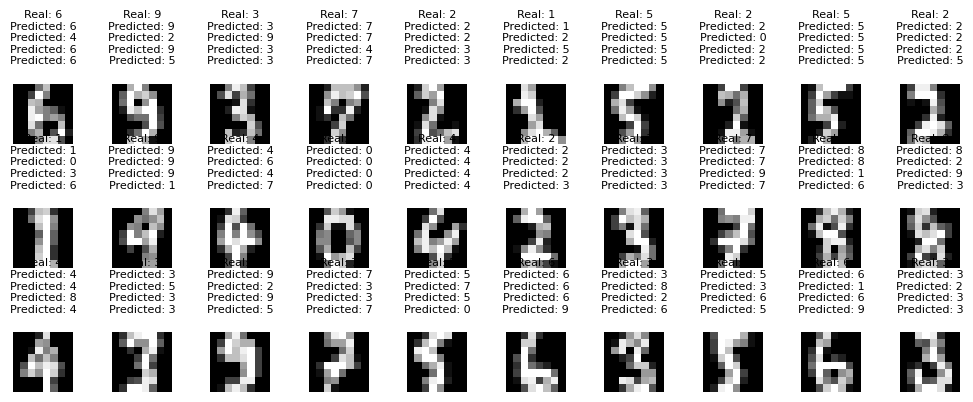

In [405]:
#Number of observations
observations = 30

plt.figure(figsize=(2, 2))
#Plot iteratively
plt.figure(figsize=(10, 4))
for i in range(observations):
    plt.subplot(3, 10, i + 1)
    plt.imshow(DS.images[idx_test[i]], cmap='gray')
    plt.title(f'Real: {y_test[i]}\n'
                  f'Predicted: {y_predict_all[i]}\n'
                  f'Predicted: {y_predict1[i]}\n'
                  f'Predicted: {y_predict4[i]}\n'
                  f'Predicted: {y_predict8[i]}\n'
                  , fontsize=8)
    plt.axis('off')
plt.tight_layout()
plt.show()

### Questions

Provides a detailed description of your results (e.g., in which case the classification performance is better, with ClassifierAll, Classifier1col, Classifier4col, or Classifier8col).

- Your response (argue your response):
-> ClassifierAll had the greatest accuracy among all cases. 98% accuracy as compared to 40% accuracy. This shows that  clearly the best case scenario is ClassifierAll. This is shown not only by the accuracy but also in the confusion matrix where only a few values where false positives.
When printing the values, it can also be seen that ClassifierAll found the right answer in all of the values printed, while the other classifiers where not as accurate.

# PART 4

## Descripción de tu percepcion del nivel de desarrollo de la subcompetencia

### SING0202A Interpretación de variables


Escribe tu description del nivel de logro del siguiente criterio de la subcompetencia

**Interpreta interacciones**. Interpreta interacciones entre variables relevantes en un problema, como base para la construcción de modelos bivariados basados en datos de un fenómeno investigado que le permita reproducir la respuesta del mismo.

- Tu respuesta:
-> A lo largo de esta Semana Tec desarrollé mi capacidad de interpretar diferentes conjuntos de datos. Las variables se suelen encontrar en las columnas y las observaciones por variable en las filas. Además, aprendí a analizar las variables utilizando estadítca descriptiva y diferentes gráficas en Python; y pude hacer un análisis de dichas variables.

Escribe tu description del nivel de logro del siguiente criterio de la subcompetencia

**Construcción de modelos**. Es capaz de construir modelos bivariados que expliquen el comportamiento de un fenómeno.

- Tu respuesta:
-> Desarrollé mi capacidad de construir modelos para explicar el comportamiento de un fenómeno. Aprendí a utilizar algoritmos de clustering y de clasificación para diferenciar datos dentro de un conjunto, además de analizar los resultados e identificar el mejor modelo.